# Ejercicio 1

1. Genere diferentes máscaras de promediado, utilizando filtro de promediado o caja (box filter) y el formato cruz.
Aplique los filtros sobre una imagen y verifique los efectos de aumentar el tamaño de la máscara en la imagen resultante.
Ayuda: `max = np.ones ((3,3), np.float32)/9`.

In [2]:
def kernelCruzPromediado(size: int):
    """Crear kernel de promediado en cruz

    Args:
        size (int): tamanio
    """
    # asegurar size impar
    if size % 2 == 0:
        size += 1

    kernel = np.zeros((size, size), dtype=np.float32)
    centro = size // 2

    kernel[centro, :] = 1
    kernel[:, centro] = 1

    # Normalzar pesos
    kernel /= kernel.sum()

    return kernel

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider, FloatSlider, Dropdown

img = cv2.imread("imagenes/firewatch.png", cv2.IMREAD_GRAYSCALE)

# funcion de actualizacion
def aplicarFiltro(size, tipoKernel):
    # aplicar filtro
    if tipoKernel == 'cross':
        img_f = cv2.filter2D(src=img, ddepth=-1, kernel=kernelCruzPromediado(size))
    else:
        img_f = cv2.boxFilter(src=img, ddepth=-1, ksize=(size, size))

    fig, ax = plt.subplots(1, 2, figsize=(14, 5))

    # img original
    ax[0].imshow(img, cmap="gray")
    ax[0].set_title("Original")
    ax[0].axis("off")

    # img filtrada
    ax[1].imshow(img_f, cmap="gray")
    ax[1].set_title(f"Filtrada ({tipoKernel} {size}x{size})")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

interact(
    aplicarFiltro,
    size=IntSlider(
        value=3,
        min=1,
        max=31,
        step=2, # valores impares
        description="Tamaño de mascara"
    ),
    tipoKernel=Dropdown(
        options=["box", "cross"],
        value="box",
        description="Kernel"
    )
);

interactive(children=(IntSlider(value=3, description='Tamaño de mascara', max=31, min=1, step=2), Dropdown(des…

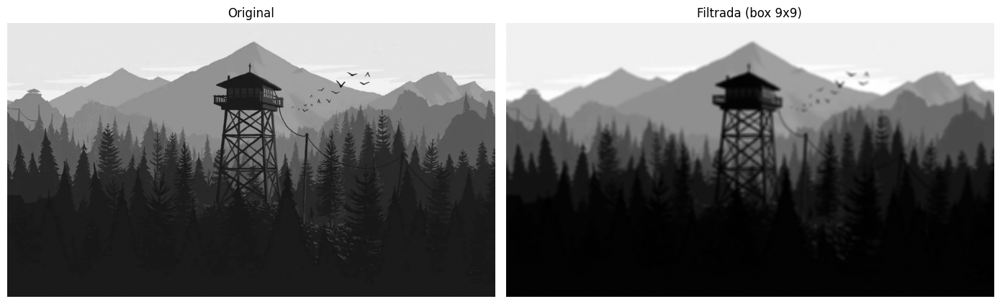

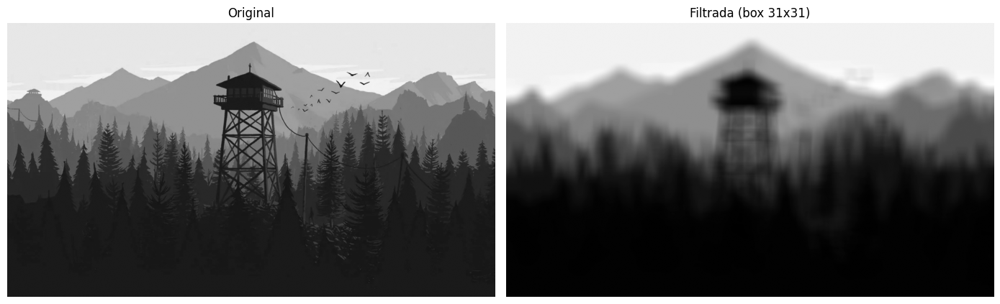

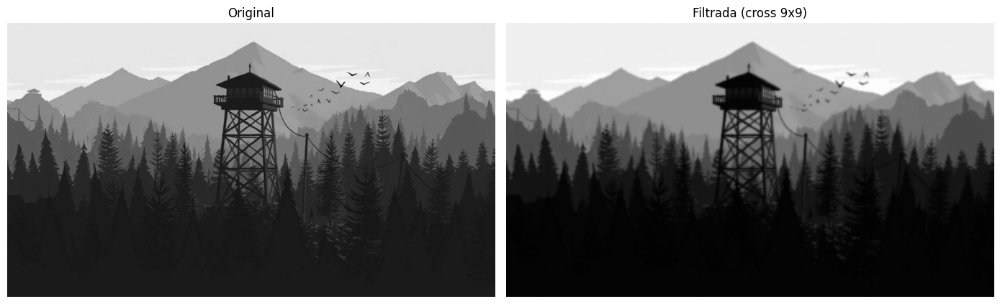

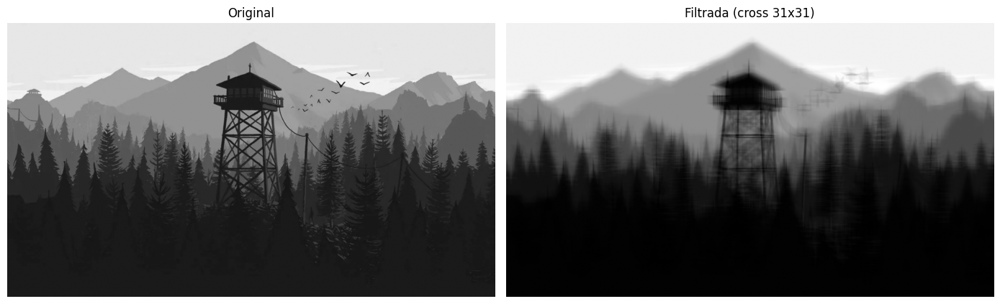

In [6]:
aplicarFiltro(9, "box")
aplicarFiltro(31, "box")
aplicarFiltro(9, "cross")
aplicarFiltro(31, "cross")

> 2. Genere máscaras de filtrado gaussianas con diferentes $\sigma$ y diferente tamaño. Visualice y aplique las máscaras sobre una imagen. Compare los resultados con los de un filtro de promediado del mismo tamaño.

Aunque el tamaño del kernel es el parámetro con mayor impacto, en el filtro gaussiano podemos ajustar el nivel de detalle que queremos mantener con la desviación estándar.

In [11]:
# funcion de actualizacion
def aplicarFiltro(size, sigma, tipoKernel):
    # filtro promediado
    if tipoKernel == 'cross':
        img_prom = cv2.filter2D(src=img, ddepth=-1, kernel=kernelCruzPromediado(size))
    else:
        img_prom = cv2.boxFilter(src=img, ddepth=-1, ksize=(size, size))

    # filtro gaussiano
    img_gauss = cv2.GaussianBlur(src=img, ksize=(size, size), sigmaX=sigma, sigmaY=sigma)

    fig, ax = plt.subplots(1, 3, figsize=(14, 5))

    # img original
    ax[0].imshow(img, cmap="gray")
    ax[0].set_title("Original")
    ax[0].axis("off")

    # gaussiano
    ax[1].imshow(img_gauss, cmap="gray")
    ax[1].set_title(f"Gaussiano (ksize {size} sigma {sigma})")
    ax[1].axis("off")

    # promediado
    ax[2].imshow(img_prom, cmap="gray")
    ax[2].set_title(f"Promediado (kernel {tipoKernel}, size {size})")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

interact(
    aplicarFiltro,
    size=IntSlider(
        value=3,
        min=1,
        max=31,
        step=2, # valores impares
        description="Tamaño de mascara"
    ),
    sigma=FloatSlider(
        value=0.1,
        min=0.1,
        max=50,
        step=0.1,
        description="sigma"
    ),
    tipoKernel=Dropdown(
        options=["box", "cross"],
        value="box",
        description="Kernel"
    )
);

interactive(children=(IntSlider(value=3, description='Tamaño de mascara', max=31, min=1, step=2), FloatSlider(…

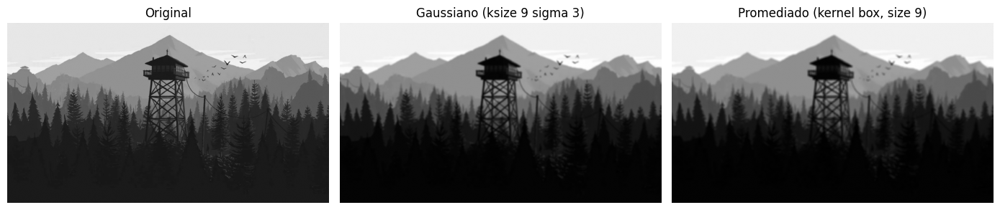

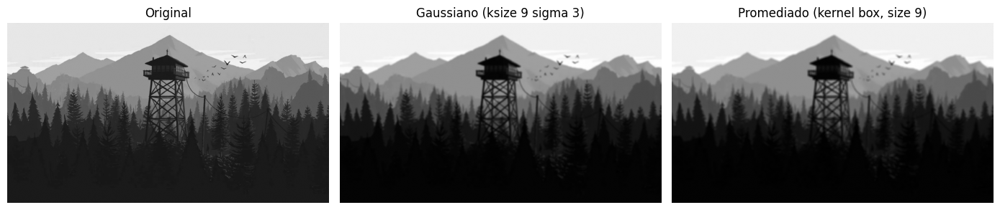

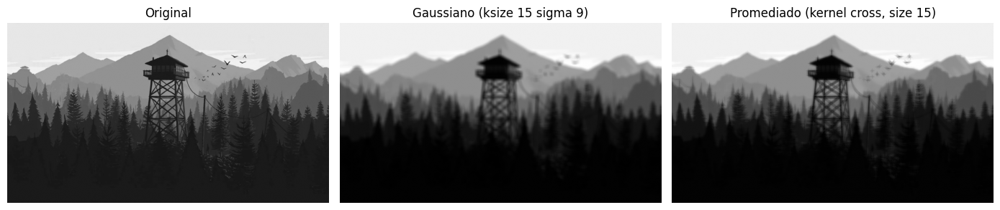

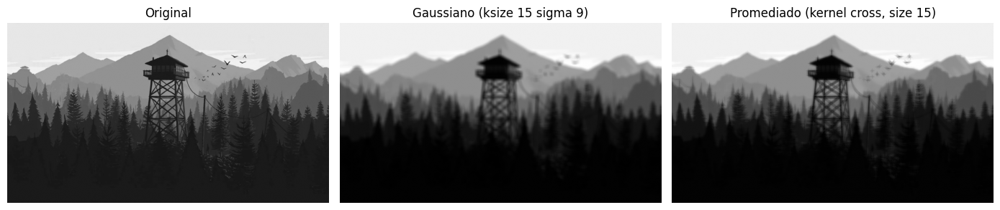

In [12]:
aplicarFiltro(9, 3, "box")
aplicarFiltro(9, 3, "box")
aplicarFiltro(15, 9, "cross")
aplicarFiltro(15, 9, "cross")

> 3. Utilice el filtro de mediana sobre una imagen con diferentes tamaños de ventana. Compare los resultados con los filtros anteriores para un mismo tamaño.

En este caso se nota que no es un filtro lineal, por el efecto de "pintura" que toma la imagen. Se pierden detalles y se nota "manchada".

In [14]:
# funcion de actualizacion
def aplicarFiltro(size, sigma, tipoKernel):
    # filtro promediado
    if tipoKernel == 'cross':
        img_prom = cv2.filter2D(src=img, ddepth=-1, kernel=kernelCruzPromediado(size))
    else:
        img_prom = cv2.boxFilter(src=img, ddepth=-1, ksize=(size, size))

    # filtro gaussiano
    img_gauss = cv2.GaussianBlur(src=img, ksize=(size, size), sigmaX=sigma, sigmaY=sigma)

    # filtro de mediana
    img_med = cv2.medianBlur(src=img, ksize=size)

    fig, ax = plt.subplots(2, 2, figsize=(14, 5))

    # img original
    ax[0][0].imshow(img, cmap="gray")
    ax[0][0].set_title("Original")
    ax[0][0].axis("off")

    # mediana
    ax[0][1].imshow(img_med, cmap="gray")
    ax[0][1].set_title(f"Mediana (ksize {size})")
    ax[0][1].axis("off")

    # promediado
    ax[1][0].imshow(img_prom, cmap="gray")
    ax[1][0].set_title(f"Promediado (kernel {tipoKernel}, size {size})")
    ax[1][0].axis("off")

    # gaussiano
    ax[1][1].imshow(img_gauss, cmap="gray")
    ax[1][1].set_title(f"Gaussiano (ksize {size} sigma {sigma})")
    ax[1][1].axis("off")

    plt.tight_layout()
    plt.show()

interact(
    aplicarFiltro,
    size=IntSlider(
        value=3,
        min=1,
        max=31,
        step=2, # valores impares
        description="Tamaño de mascara"
    ),
    sigma=FloatSlider(
        value=0.1,
        min=0.1,
        max=50,
        step=0.1,
        description="sigma"
    ),
    tipoKernel=Dropdown(
        options=["box", "cross"],
        value="box",
        description="Kernel"
    )
);

interactive(children=(IntSlider(value=3, description='Tamaño de mascara', max=31, min=1, step=2), FloatSlider(…

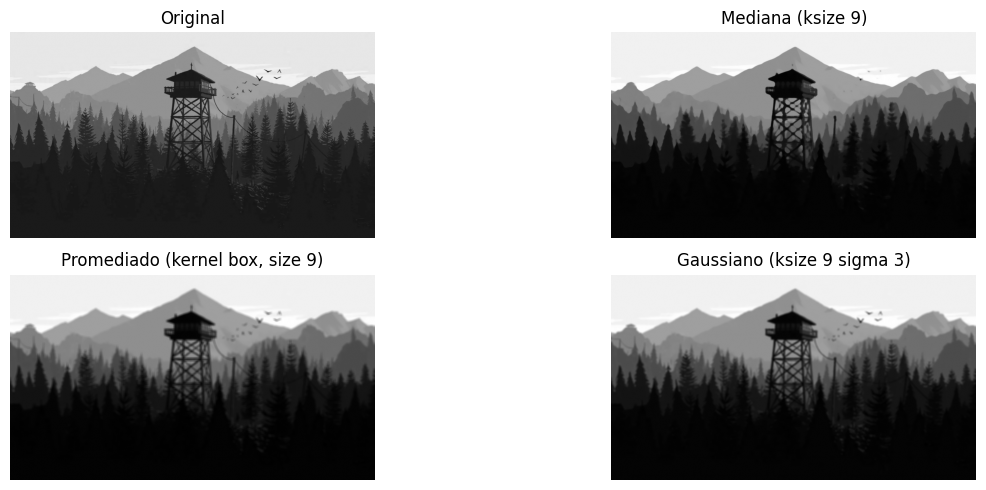

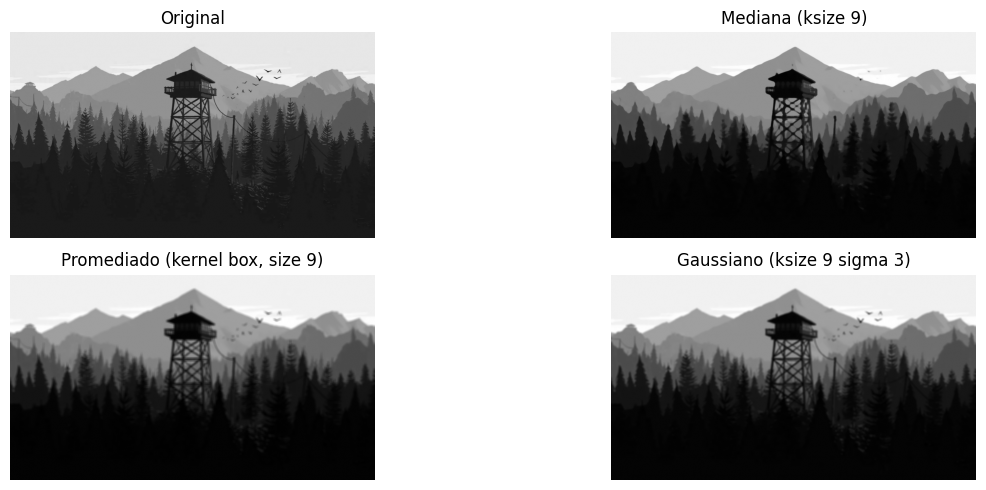

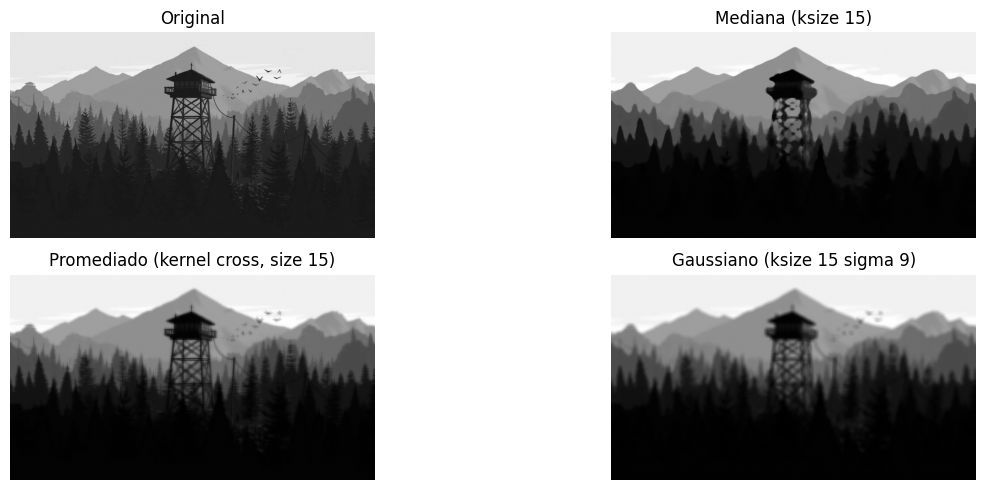

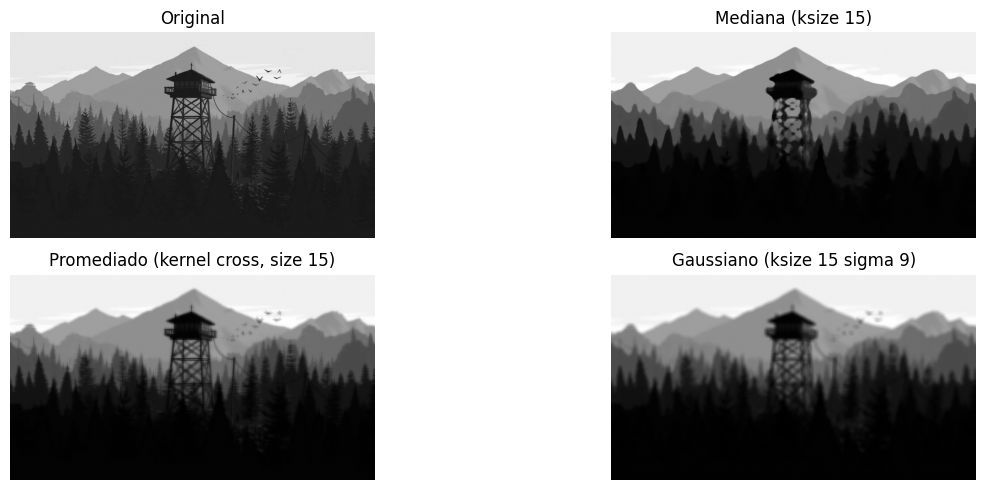

In [15]:
aplicarFiltro(9, 3, "box")
aplicarFiltro(9, 3, "box")
aplicarFiltro(15, 9, "cross")
aplicarFiltro(15, 9, "cross")

4. Los filtros pasa-bajos pueden utilizarse para localizar objetos grandes en una escena. Aplique este concepto a la imagen `hubble.tif` y obtenga una imagen de grises cuyos objectos correspondan solamente a los de mayor tamaño de la original.

> Se aplico una mejora de contraste primero para que el filtro sea mas significativo.

In [16]:
hubble = cv2.imread("imagenes/hubble.tif", cv2.IMREAD_GRAYSCALE)

def actualizar(size, sigma, umbral):
    # filtrado pasa-bajos gaussiano
    hubble_f = cv2.GaussianBlur(src=hubble, ksize=(size, size), sigmaX=sigma, sigmaY=sigma)

    # mascara por umbralizacion
    _, mask = cv2.threshold(src=hubble_f, thresh=umbral, maxval=255, type=cv2.THRESH_BINARY)

    # aplicar mascara
    hubble_final = hubble * (mask/255)

    fig, ax = plt.subplots(1, 4, figsize=(14, 5))

    # img original
    ax[0].imshow(hubble, cmap="gray")
    ax[0].set_title("Original")
    ax[0].axis("off")

    # filtrado
    ax[1].imshow(hubble_f, cmap="gray")
    ax[1].set_title("Gaussiano")
    ax[1].axis("off")

    # mascara
    ax[2].imshow(mask, cmap="gray")
    ax[2].set_title("Mascara")
    ax[2].axis("off")

    # final
    ax[3].imshow(hubble_final, cmap="gray")
    ax[3].set_title("Final")
    ax[3].axis("off")

    plt.tight_layout()
    plt.show()

interact(
    actualizar,
    size=IntSlider(
        value=3,
        min=1,
        max=201,
        step=2, # valores impares
        description="Tamaño de kernel"
    ),
    sigma=FloatSlider(
        value=0.1,
        min=0.1,
        max=50,
        step=0.1,
        description="sigma"
    ),
    umbral=IntSlider(
        value=3,
        min=1,
        max=50,
        step=1, # valores impares
        description="Umbral"
    ),
);

interactive(children=(IntSlider(value=3, description='Tamaño de kernel', max=201, min=1, step=2), FloatSlider(…

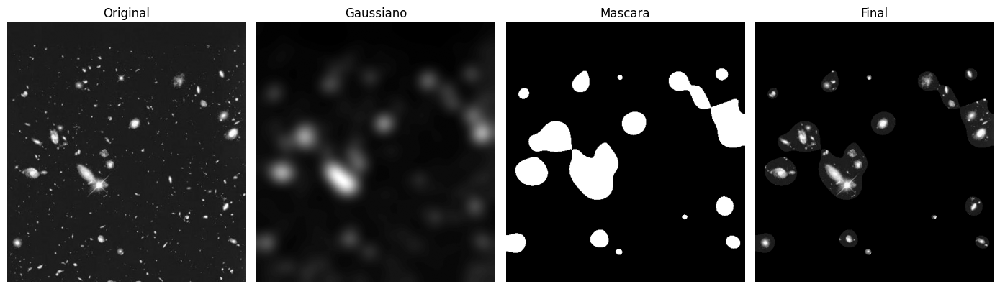

In [17]:
actualizar(65, 14, 40)

Con el filtro gaussiano la difumación hace que las regiones de interés sean más grandes que los objetos que se quieren mostrar. Con filtro de mediana se tienen mejores resultados.

In [18]:
def actualizar(size, umbral):
    # filtrado de mediana
    hubble_f = cv2.medianBlur(src=hubble, ksize=size)

    # mascara por umbralizacion
    _, mask = cv2.threshold(src=hubble_f, thresh=umbral, maxval=255, type=cv2.THRESH_BINARY)

    # aplicar mascara
    hubble_final = hubble * (mask/255)

    fig, ax = plt.subplots(1, 4, figsize=(14, 5))

    # img original
    ax[0].imshow(hubble, cmap="gray")
    ax[0].set_title("Original")
    ax[0].axis("off")

    # filtrado
    ax[1].imshow(hubble_f, cmap="gray")
    ax[1].set_title("Mediana")
    ax[1].axis("off")

    # mascara
    ax[2].imshow(mask, cmap="gray")
    ax[2].set_title("Mascara")
    ax[2].axis("off")

    # final
    ax[3].imshow(hubble_final, cmap="gray")
    ax[3].set_title("Final")
    ax[3].axis("off")

    plt.tight_layout()
    plt.show()

interact(
    actualizar,
    size=IntSlider(
        value=3,
        min=1,
        max=201,
        step=2, # valores impares
        description="Tamaño de kernel"
    ),
    umbral=IntSlider(
        value=3,
        min=1,
        max=50,
        step=1, # valores impares
        description="Umbral"
    ),
);

interactive(children=(IntSlider(value=3, description='Tamaño de kernel', max=201, min=1, step=2), IntSlider(va…

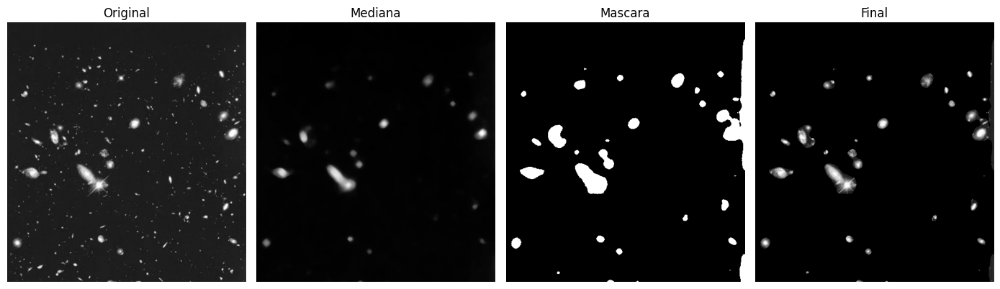

In [19]:
actualizar(15, 35)

# Ejercicio 2

1. Defina máscaras de filtrado pasa-altos cuyos coeficientes sumen 1 y aplíquelas sobre diferentes imágenes. Interprete los resultados.

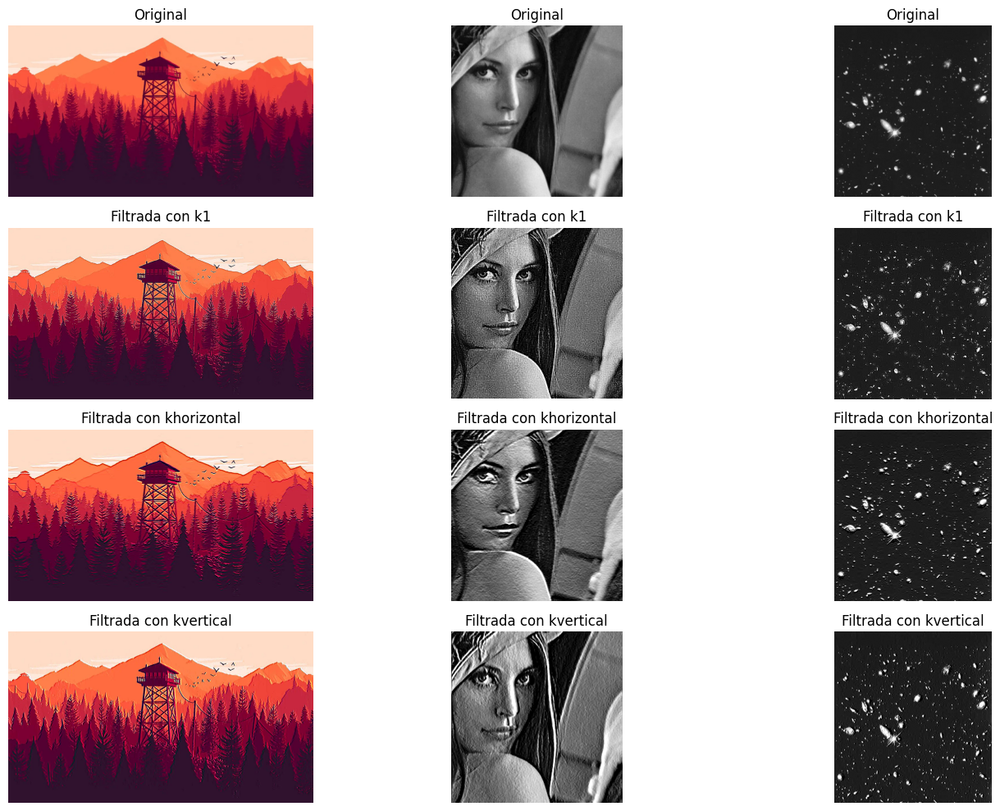

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider, FloatSlider, Dropdown

firewatch = cv2.imread("imagenes/firewatch.png", cv2.IMREAD_COLOR_RGB)
huang = cv2.imread("imagenes/huang1.jpg", cv2.IMREAD_GRAYSCALE)
hubble = cv2.imread("imagenes/hubble.tif", cv2.IMREAD_GRAYSCALE)

# kernel
k1 = np.array([
    [-1,-1,-1],
    [-1, 9,-1],
    [-1,-1,-1],
])
khorizontal = np.array([
    [-1,-2,-1],
    [ 0, 1, 0],
    [ 1, 2, 1],
])
kvertical = np.array([
    [-1, 0, 1],
    [-2, 1, 2],
    [-1, 0, 1],
])

# aplicar filtro
firewatch_f1 = cv2.filter2D(src=firewatch, ddepth=-1, kernel=k1)
firewatch_horizontal = cv2.filter2D(src=firewatch, ddepth=-1, kernel=khorizontal)
firewatch_vertical = cv2.filter2D(src=firewatch, ddepth=-1, kernel=kvertical)
huang_f1 = cv2.filter2D(src=huang, ddepth=-1, kernel=k1)
huang_horizontal = cv2.filter2D(src=huang, ddepth=-1, kernel=khorizontal)
huang_vertical = cv2.filter2D(src=huang, ddepth=-1, kernel=kvertical)
hubble_f1 = cv2.filter2D(src=hubble, ddepth=-1, kernel=k1)
hubble_horizontal = cv2.filter2D(src=hubble, ddepth=-1, kernel=khorizontal)
hubble_vertical = cv2.filter2D(src=hubble, ddepth=-1, kernel=kvertical)

fig, ax = plt.subplots(4, 3)
fig.set_figwidth(15)
fig.set_figheight(10)

# firewatch
ax[0][0].imshow(firewatch)
ax[0][0].set_title("Original")
ax[0][0].axis("off")
ax[1][0].imshow(firewatch_f1)
ax[1][0].set_title("Filtrada con k1")
ax[1][0].axis("off")
ax[2][0].imshow(firewatch_horizontal)
ax[2][0].set_title("Filtrada con khorizontal")
ax[2][0].axis("off")
ax[3][0].imshow(firewatch_vertical)
ax[3][0].set_title("Filtrada con kvertical")
ax[3][0].axis("off")

# huang
ax[0][1].imshow(huang, cmap='gray')
ax[0][1].set_title("Original")
ax[0][1].axis("off")
ax[1][1].imshow(huang_f1, cmap='gray')
ax[1][1].set_title("Filtrada con k1")
ax[1][1].axis("off")
ax[2][1].imshow(huang_horizontal, cmap='gray')
ax[2][1].set_title("Filtrada con khorizontal")
ax[2][1].axis("off")
ax[3][1].imshow(huang_vertical, cmap='gray')
ax[3][1].set_title("Filtrada con kvertical")
ax[3][1].axis("off")

# hubble
ax[0][2].imshow(hubble, cmap='gray')
ax[0][2].set_title("Original")
ax[0][2].axis("off")
ax[1][2].imshow(hubble_f1, cmap='gray')
ax[1][2].set_title("Filtrada con k1")
ax[1][2].axis("off")
ax[2][2].imshow(hubble_horizontal, cmap='gray')
ax[2][2].set_title("Filtrada con khorizontal")
ax[2][2].axis("off")
ax[3][2].imshow(hubble_vertical, cmap='gray')
ax[3][2].set_title("Filtrada con kvertical")
ax[3][2].axis("off")

plt.tight_layout()
plt.show();

2. Repita el ejercicio anterior para máscaras cuyos coeficientes sumen 0. Compare los resultados con los del punto anterior.

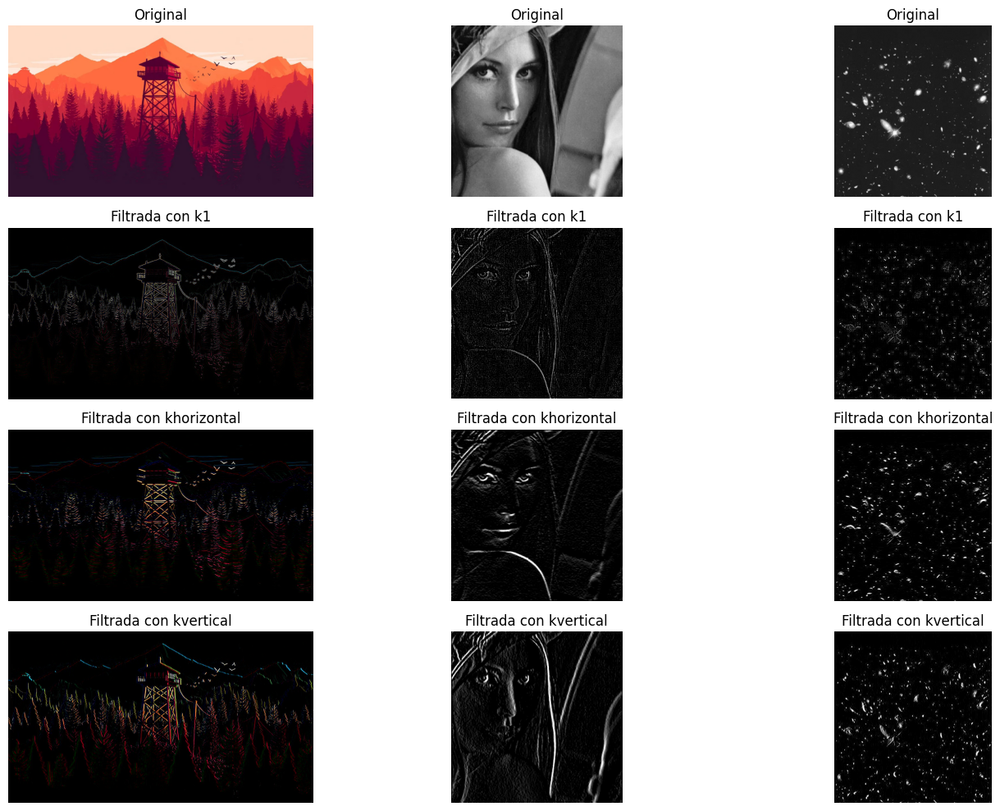

In [21]:
# kernel
k1 = np.array([
    [-1,-1,-1],
    [-1, 8,-1],
    [-1,-1,-1],
])
khorizontal = np.array([
    [-1,-2,-1],
    [ 0, 0, 0],
    [ 1, 2, 1],
])
kvertical = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1],
])

# aplicar filtro
firewatch_f1 = cv2.filter2D(src=firewatch, ddepth=-1, kernel=k1)
firewatch_horizontal = cv2.filter2D(src=firewatch, ddepth=-1, kernel=khorizontal)
firewatch_vertical = cv2.filter2D(src=firewatch, ddepth=-1, kernel=kvertical)
huang_f1 = cv2.filter2D(src=huang, ddepth=-1, kernel=k1)
huang_horizontal = cv2.filter2D(src=huang, ddepth=-1, kernel=khorizontal)
huang_vertical = cv2.filter2D(src=huang, ddepth=-1, kernel=kvertical)
hubble_f1 = cv2.filter2D(src=hubble, ddepth=-1, kernel=k1)
hubble_horizontal = cv2.filter2D(src=hubble, ddepth=-1, kernel=khorizontal)
hubble_vertical = cv2.filter2D(src=hubble, ddepth=-1, kernel=kvertical)

fig, ax = plt.subplots(4, 3)
fig.set_figwidth(15)
fig.set_figheight(10)

# firewatch
ax[0][0].imshow(firewatch)
ax[0][0].set_title("Original")
ax[0][0].axis("off")
ax[1][0].imshow(firewatch_f1)
ax[1][0].set_title("Filtrada con k1")
ax[1][0].axis("off")
ax[2][0].imshow(firewatch_horizontal)
ax[2][0].set_title("Filtrada con khorizontal")
ax[2][0].axis("off")
ax[3][0].imshow(firewatch_vertical)
ax[3][0].set_title("Filtrada con kvertical")
ax[3][0].axis("off")

# huang
ax[0][1].imshow(huang, cmap='gray')
ax[0][1].set_title("Original")
ax[0][1].axis("off")
ax[1][1].imshow(huang_f1, cmap='gray')
ax[1][1].set_title("Filtrada con k1")
ax[1][1].axis("off")
ax[2][1].imshow(huang_horizontal, cmap='gray')
ax[2][1].set_title("Filtrada con khorizontal")
ax[2][1].axis("off")
ax[3][1].imshow(huang_vertical, cmap='gray')
ax[3][1].set_title("Filtrada con kvertical")
ax[3][1].axis("off")

# hubble
ax[0][2].imshow(hubble, cmap='gray')
ax[0][2].set_title("Original")
ax[0][2].axis("off")
ax[1][2].imshow(hubble_f1, cmap='gray')
ax[1][2].set_title("Filtrada con k1")
ax[1][2].axis("off")
ax[2][2].imshow(hubble_horizontal, cmap='gray')
ax[2][2].set_title("Filtrada con khorizontal")
ax[2][2].axis("off")
ax[3][2].imshow(hubble_vertical, cmap='gray')
ax[3][2].set_title("Filtrada con kvertical")
ax[3][2].axis("off")

plt.tight_layout()
plt.show();

Con ambos kernels se resaltaron los contornos (y, en el caso de `huang.jpg` y `hubble.jpg`, el ruido), pero en el segundo caso perdemos el brillo base, por lo que las áreas uniformes son eliminadas.
Cuanto mayor es la diferencias entre los bordes del kernel y el centro, más se destacan los detalles (y el ruido)

# Ejercicio 3

1. Obtenga versiones mejoradas de diferentes imágenes mediante el filtrado por máscara difusa. Implemente el cálculo como

$$
g(x,y) = f(x,y) - PB(f(x,y))
$$

In [24]:
def altaPotencia(img, kernelSize=(3,3), sigma=1, A=1):
    img_float = np.float32(img)
    return A*img_float - cv2.GaussianBlur(img_float, kernelSize, sigmaX=sigma, sigmaY=sigma)

In [25]:
from ipywidgets import interact, IntSlider, FloatSlider, Dropdown

firewatch = cv2.imread("imagenes/firewatch.png", cv2.IMREAD_GRAYSCALE)
huang = cv2.imread("imagenes/huang1.jpg", cv2.IMREAD_GRAYSCALE)
hubble = cv2.imread("imagenes/hubble.tif", cv2.IMREAD_GRAYSCALE)

# funcion de actualizacion
def aplicarFiltro(size, sigma, A):
    A = 1 if A==1.0 else A  # para safar la cara de errores de precision (A=1.0 es 1.00...algo, o sea 1.0>1)
    # filtrar
    img_f = altaPotencia(img=firewatch, kernelSize=(size, size), sigma=sigma, A=A)

    fig, ax = plt.subplots(1, 2, figsize=(14, 5))

    # img original
    ax[0].imshow(firewatch, cmap="gray")
    ax[0].set_title("Original")
    ax[0].axis("off")

    # img filtrada
    ax[1].imshow(img_f, cmap="gray")
    ax[1].set_title(f"Filtrada")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

interact(
    aplicarFiltro,
    size=IntSlider(
        value=3,
        min=1,
        max=31,
        step=2, # valores impares
        description="Tamaño de kernel"
    ),
    sigma=FloatSlider(
        value=1,
        min=0.1,
        max=5,
        step=0.1,
        description="sigma"
    ),
    A=FloatSlider(
        value=1,
        min=1,
        max=5,
        step=0.1,
        description="A"
    )
);

interactive(children=(IntSlider(value=3, description='Tamaño de kernel', max=31, min=1, step=2), FloatSlider(v…

In [27]:
# no tan nitido
aplicarFiltro(size=3, sigma=0.5, A=1.0)
# mas nitido y con brillo
aplicarFiltro(size=3, sigma=0.5, A=2.5)
aplicarFiltro(size=3, sigma=0.5, A=5.0)
# ksize mas grande
aplicarFiltro(size=15, sigma=0.5, A=2.0)
aplicarFiltro(size=31, sigma=0.5, A=2.0)
# mas sigma => bordes mas nitidos
aplicarFiltro(size=3, sigma=2.5, A=2.0)
aplicarFiltro(size=3, sigma=5.0, A=2.0)

Output hidden; open in https://colab.research.google.com to view.

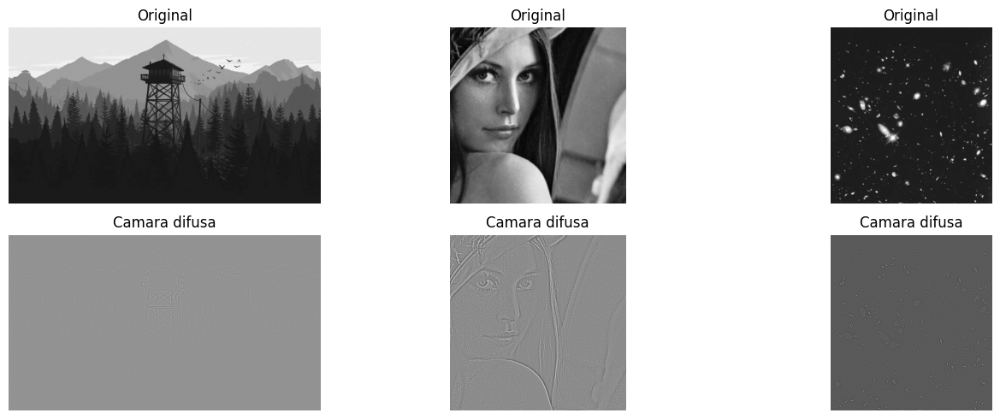

In [30]:
# Alta potencia con A=1 es equivalente a mascara difusa
As = [1, 1.5, 2.5, 3.5]

fig, ax = plt.subplots(2, 3, figsize=(14, 5))

# original
ax[0][0].imshow(firewatch, cmap="gray")
ax[0][0].set_title("Original")
ax[0][0].axis("off")
ax[0][1].imshow(huang, cmap="gray")
ax[0][1].set_title("Original")
ax[0][1].axis("off")
ax[0][2].imshow(hubble, cmap="gray")
ax[0][2].set_title("Original")
ax[0][2].axis("off")

# alta potencia
ax[1][0].imshow(altaPotencia(img=firewatch, A=1), cmap="gray")
ax[1][0].set_title(f"Camara difusa")
ax[1][0].axis("off")
ax[1][1].imshow(altaPotencia(img=huang, A=1), cmap="gray")
ax[1][1].set_title(f"Camara difusa")
ax[1][1].axis("off")
ax[1][2].imshow(altaPotencia(img=hubble, A=1), cmap="gray")
ax[1][2].set_title(f"Camara difusa")
ax[1][2].axis("off")

plt.tight_layout()
plt.show();

2. Una forma de enfatizar las altas frecuencias sin perder los detalles de bajas frecuencias es el filtrado de alta potencia. Implemente este procesamiento como la operación aritmética:

$$
g(x,y) = Af(x,y) - PB(f(x,y)), \text{ con A }\geq 1
$$

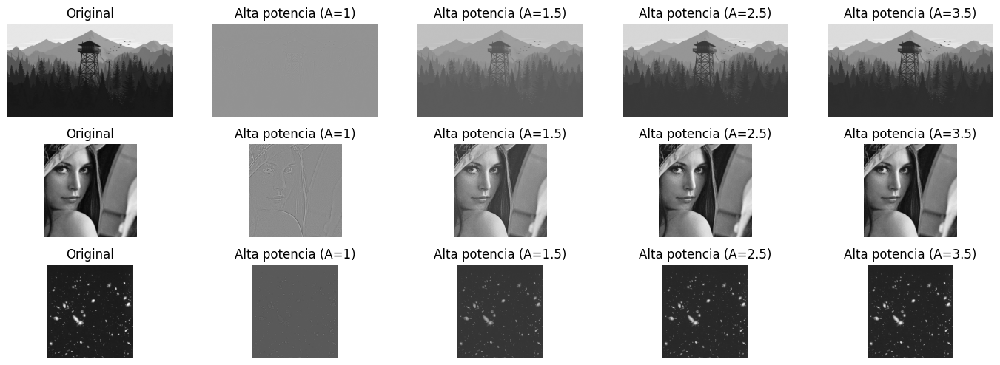

In [32]:
# Alta potencia con A=1 es equivalente a mascara difusa
As = [1, 1.5, 2.5, 3.5]

fig, ax = plt.subplots(3, 5, figsize=(14, 5))

# original
ax[0][0].imshow(firewatch, cmap="gray")
ax[0][0].set_title("Original")
ax[0][0].axis("off")
ax[1][0].imshow(huang, cmap="gray")
ax[1][0].set_title("Original")
ax[1][0].axis("off")
ax[2][0].imshow(hubble, cmap="gray")
ax[2][0].set_title("Original")
ax[2][0].axis("off")

# alta potencia
for i,A in enumerate(As):
    ax[0][i+1].imshow(altaPotencia(img=firewatch, A=A), cmap="gray")
    ax[0][i+1].set_title(f"Alta potencia (A={A})")
    ax[0][i+1].axis("off")
    ax[1][i+1].imshow(altaPotencia(img=huang, A=A), cmap="gray")
    ax[1][i+1].set_title(f"Alta potencia (A={A})")
    ax[1][i+1].axis("off")
    ax[2][i+1].imshow(altaPotencia(img=hubble, A=A), cmap="gray")
    ax[2][i+1].set_title(f"Alta potencia (A={A})")
    ax[2][i+1].axis("off")

plt.tight_layout()
plt.show();

# Ejercicio 4

1. Proponga una combinación de técnicas para realzar los detalles de la imagen `esqueleto.tif`. Recuerde que esta tarea es subjetiva y depende de qué pretende realzar. Justifique cada una de las elecciones en la elaboración de su propuesta.

Primer se analiza la imagen observandola

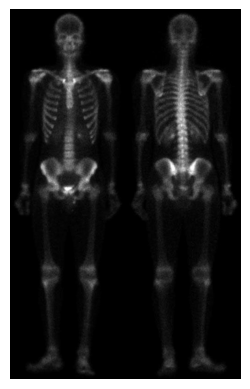

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider, FloatSlider, Dropdown

esqueleto = cv2.imread("imagenes/esqueleto.tif", cv2.IMREAD_GRAYSCALE)
fig, ax = plt.subplots(1, 1)
ax.imshow(esqueleto, cmap="gray")
ax.axis("off")
plt.show()

Se prueban transformaciones para realzar la imagen, logaritmicas y exponenciales.

> Se prueba con sliders interactivos pero luego se muestra el resultado mas prometedor. La exponencial con 0.5 es la que parece realzar mejor los detalles sin introducir demasiado ruido

In [35]:
def LUTLog(rango: np.ndarray[int] = [0, 256]) -> np.ndarray[int, float]:
    """LUT para transformacion logaritmica

    Args:
        rango (np.ndarray[int], optional): Defaults to [0, 256].

    Returns:
        np.ndarray[int, float]: LUT s = log(1+r)
    """
    grises = np.linspace(rango[0], rango[1], rango[1]-rango[0], endpoint=False)
    return np.log(1+grises)

def LUTPotencia(gamma: float, rango: np.ndarray[int] = [0, 256]) -> np.ndarray[int, float]:
    """LUT para transformacion de potencia

    Args:
        gamma (float): potencia
        rango (np.ndarray[int], optional): Defaults to [0, 256].

    Returns:
        np.ndarray[int, float]: LUT s = r^(gamma)
    """
    grises = np.linspace(rango[0], rango[1], rango[1]-rango[0], endpoint=False)
    grises_norm = grises/255.0
    # generar lut y reescalar a [0,255]
    return np.power(grises_norm, gamma) * 255.0

In [36]:
lut_log = LUTLog()
# funcion de actualizacion
def actualizar(tipo, gamma):
    if tipo == "log":
        img_t = lut_log[esqueleto[:]]
    else:
        lut_exp = LUTPotencia(gamma)
        img_t = lut_exp[esqueleto[:]]

    fig, ax = plt.subplots(1, 2, figsize=(10, 15))

    # img original
    ax[0].imshow(esqueleto, cmap="gray")
    ax[0].set_title("Original")
    ax[0].axis("off")

    # img filtrada
    ax[1].imshow(img_t, cmap="gray")
    ax[1].set_title(f"Filtrada")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

interact(
    actualizar,
    tipo=Dropdown(
        options=["log", "exp"],
        value="log",
        description="tipo de T"
    ),
    gamma=FloatSlider(
        value=1,
        min=0.1,
        max=5,
        step=0.1,
        description="gamma"
    )
);

interactive(children=(Dropdown(description='tipo de T', options=('log', 'exp'), value='log'), FloatSlider(valu…

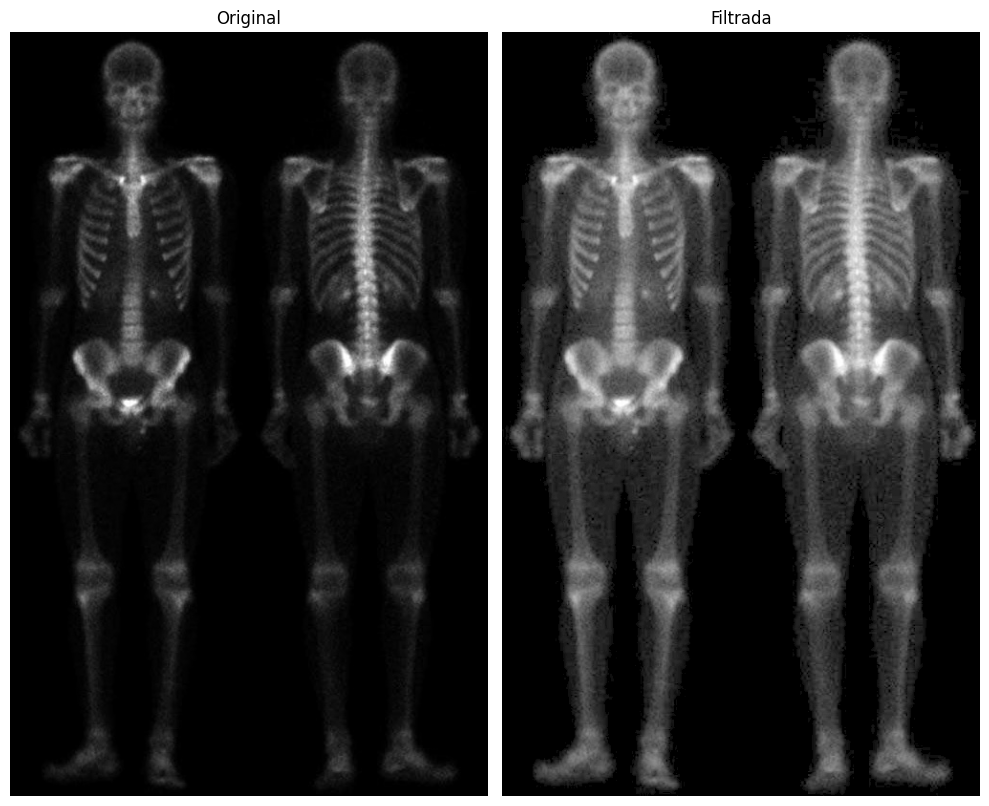

In [37]:
lut_exp = LUTPotencia(gamma=0.5)
esqueleto_t = lut_exp[esqueleto[:]]

fig, ax = plt.subplots(1, 2, figsize=(10, 15))

# img original
ax[0].imshow(esqueleto, cmap="gray")
ax[0].set_title("Original")
ax[0].axis("off")

# img filtrada
ax[1].imshow(esqueleto_t, cmap="gray")
ax[1].set_title(f"Filtrada")
ax[1].axis("off")

plt.tight_layout()
plt.show()

Luego vamos a querer filtrar la silueta (umbralización) y realzar aun mas las altas frecuencias (detalles), por lo que probamos un highboost con distintos valores de A.

> Otra vez, probaremos los valores de umbralizacion y A con sliders interactivos, luego se muestran los resultados mas prometedores.

In [39]:
# funcion de actualizacion
def actualizar(umbral, A):
    A = 1 if A==1.0 else A
    # umbralizar
    _, mask = cv2.threshold(src=esqueleto_t, thresh=umbral, maxval=255, type=cv2.THRESH_BINARY)
    esqueleto_umbral = np.multiply(esqueleto_t, mask)

    # highboost
    esqueleto_f = altaPotencia(img=esqueleto_umbral, A=A)

    fig, ax = plt.subplots(1, 3, figsize=(10, 15))

    # transformada
    ax[0].imshow(esqueleto_t, cmap="gray")
    ax[0].set_title("transformada")
    ax[0].axis("off")

    # umbralizada
    ax[1].imshow(esqueleto_umbral, cmap="gray")
    ax[1].set_title(f"umbralizada")
    ax[1].axis("off")

    # filtro high boost
    ax[2].imshow(esqueleto_f, cmap="gray")
    ax[2].set_title(f"high boost")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

interact(
    actualizar,
    umbral=FloatSlider(
        value=5,
        min=5,
        max=100,
        step=1,
        description="umbral"
    ),
    A=FloatSlider(
        value=1,
        min=1,
        max=10,
        step=0.1,
        description="A"
    )
);

interactive(children=(FloatSlider(value=5.0, description='umbral', min=5.0, step=1.0), FloatSlider(value=1.0, …

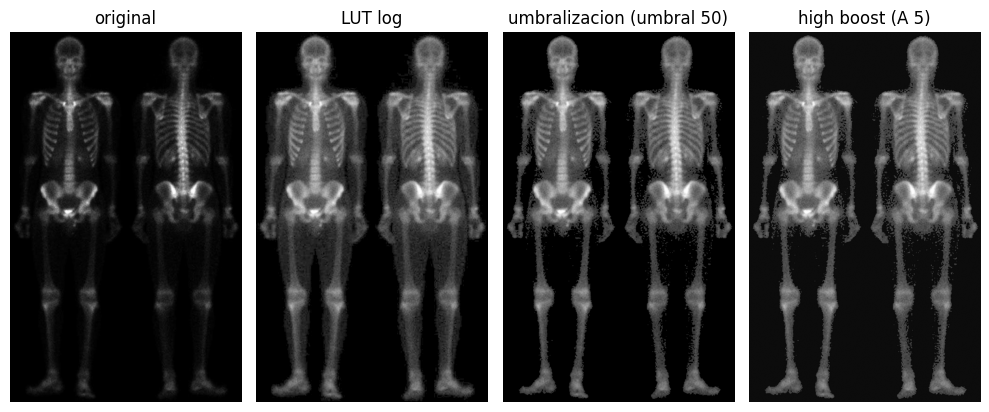

In [42]:
# umbralizar
umbral = 50
_, mask = cv2.threshold(src=esqueleto_t, thresh=umbral, maxval=255, type=cv2.THRESH_BINARY)
esqueleto_umbral = np.multiply(esqueleto_t, mask)

# highboost
A = 5
esqueleto_f = altaPotencia(img=esqueleto_umbral, A=A)

fig, ax = plt.subplots(1, 4, figsize=(10, 15))

# original
ax[0].imshow(esqueleto, cmap="gray")
ax[0].set_title("original")
ax[0].axis("off")

# transformada
ax[1].imshow(esqueleto_t, cmap="gray")
ax[1].set_title("LUT log")
ax[1].axis("off")

# umbralizada
ax[2].imshow(esqueleto_umbral, cmap="gray")
ax[2].set_title(f"umbralizacion (umbral {umbral})")
ax[2].axis("off")

# filtro high boost
ax[3].imshow(esqueleto_f, cmap="gray")
ax[3].set_title(f"high boost (A {A})")
ax[3].axis("off")

plt.tight_layout()
plt.show()

2. Aplique un filtro pasa-bajos de su elección y el filtro bilateral a las siguientes imágenes: `mariposa02.png`, `flores02.jpg` y `lapices02.jpg` (en escala de grises).
Compare los resultados y explique sus apreciaciones.

- Utilice la función implementada en la guía anterior para visualizar perfiles de grises, eligiendo la misma fila o columna para la imagen original y las que han sido filtradas. Compare los resultados visualizándolos simultáneamente.
- [Opcional] Implemente una función que le permita extraer perfiles de grises de las 3 imágenes, de cualquier longitud y en cualquier dirección (a partir de clicks del mouse o mediante el ingreso de coordenadas) y que realice el ploteo de los perfiles superpuestos en difernetes colores.

> Los parametros para los filtros se encontraron probando distintos y quedandonos con los que parecian mejores.
>
> La parte interactiva se hace desde jupyter notebooks con ipywidgets

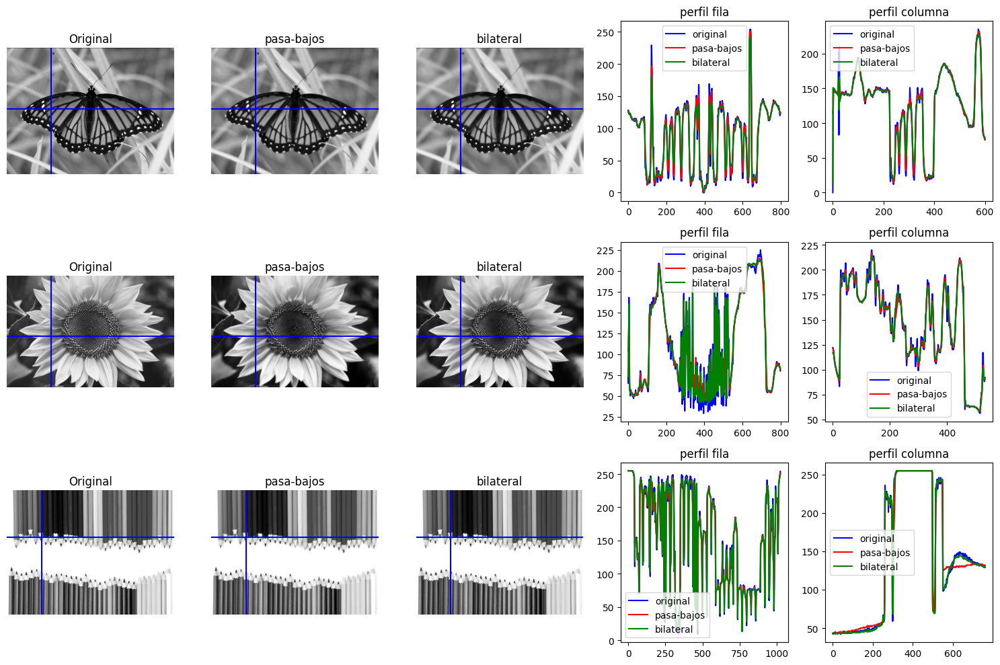

In [43]:
mariposa = cv2.imread("imagenes/mariposa02.png", cv2.IMREAD_GRAYSCALE)
mariposa_pb = cv2.GaussianBlur(mariposa, (5, 5), 2)
mariposa_bi = cv2.bilateralFilter(mariposa, 15, 50, 50)
flores = cv2.imread("imagenes/flores02.jpg", cv2.IMREAD_GRAYSCALE)
flores_pb = cv2.GaussianBlur(flores, (5, 5), 2)
flores_bi = cv2.bilateralFilter(flores, 15, 15, 15)
lapices = cv2.imread("imagenes/lapices02.jpg", cv2.IMREAD_GRAYSCALE)
lapices_pb = cv2.GaussianBlur(lapices, (5, 5), 2)
lapices_bi = cv2.bilateralFilter(lapices, 15, 10, 10)

row = 289
col = 212

fig, ax = plt.subplots(3, 5, figsize=(15, 10))

# original
ax[0][0].imshow(mariposa, cmap="gray")
ax[0][0].plot([0, mariposa.shape[1]-1], [row, row], c="blue")
ax[0][0].plot([col, col], [0, mariposa.shape[0]-1], c="blue")
ax[0][0].set_title("Original")
ax[0][0].axis("off")
ax[1][0].imshow(flores, cmap="gray")
ax[1][0].plot([0, flores.shape[1]-1], [row, row], c="blue")
ax[1][0].plot([col, col], [0, flores.shape[0]-1], c="blue")
ax[1][0].set_title("Original")
ax[1][0].axis("off")
ax[2][0].imshow(lapices, cmap="gray")
ax[2][0].plot([0, lapices.shape[1]-1], [row, row], c="blue")
ax[2][0].plot([col, col], [0, lapices.shape[0]-1], c="blue")
ax[2][0].set_title("Original")
ax[2][0].axis("off")

# pasa-bajos
ax[0][1].imshow(mariposa_pb, cmap="gray")
ax[0][1].plot([0, mariposa_pb.shape[1]-1], [row, row], c="blue")
ax[0][1].plot([col, col], [0, mariposa_pb.shape[0]-1], c="blue")
ax[0][1].set_title("pasa-bajos")
ax[0][1].axis("off")
ax[1][1].imshow(flores_pb, cmap="gray")
ax[1][1].plot([0, flores_pb.shape[1]-1], [row, row], c="blue")
ax[1][1].plot([col, col], [0, flores_pb.shape[0]-1], c="blue")
ax[1][1].set_title("pasa-bajos")
ax[1][1].axis("off")
ax[2][1].imshow(lapices_pb, cmap="gray")
ax[2][1].plot([0, lapices_pb.shape[1]-1], [row, row], c="blue")
ax[2][1].plot([col, col], [0, lapices_pb.shape[0]-1], c="blue")
ax[2][1].set_title("pasa-bajos")
ax[2][1].axis("off")

# bilateral
ax[0][2].imshow(mariposa_bi, cmap="gray")
ax[0][2].plot([0, mariposa_bi.shape[1]-1], [row, row], c="blue")
ax[0][2].plot([col, col], [0, mariposa_bi.shape[0]-1], c="blue")
ax[0][2].set_title("bilateral")
ax[0][2].axis("off")
ax[1][2].imshow(flores_bi, cmap="gray")
ax[1][2].plot([0, flores_bi.shape[1]-1], [row, row], c="blue")
ax[1][2].plot([col, col], [0, flores_bi.shape[0]-1], c="blue")
ax[1][2].set_title("bilateral")
ax[1][2].axis("off")
ax[2][2].imshow(lapices_bi, cmap="gray")
ax[2][2].plot([0, lapices_bi.shape[1]-1], [row, row], c="blue")
ax[2][2].plot([col, col], [0, lapices_bi.shape[0]-1], c="blue")
ax[2][2].set_title("bilateral")
ax[2][2].axis("off")

# perfil fila
ax[0][3].plot(mariposa[row,:], c="blue", label="original")
ax[0][3].plot(mariposa_pb[row,:], c="red", label="pasa-bajos")
ax[0][3].plot(mariposa_bi[row,:], c="green", label="bilateral")
ax[0][3].legend()
ax[0][3].set_title(f"perfil fila")
ax[1][3].plot(flores[row,:], c="blue", label="original")
ax[1][3].plot(flores_pb[row,:], c="red", label="pasa-bajos")
ax[1][3].plot(flores_bi[row,:], c="green", label="bilateral")
ax[1][3].legend()
ax[1][3].set_title(f"perfil fila")
ax[2][3].plot(lapices[row,:], c="blue", label="original")
ax[2][3].plot(lapices_pb[row,:], c="red", label="pasa-bajos")
ax[2][3].plot(lapices_bi[row,:], c="green", label="bilateral")
ax[2][3].legend()
ax[2][3].set_title(f"perfil fila")

# perfil columna
ax[0][4].plot(mariposa[:,col], c="blue", label="original")
ax[0][4].plot(mariposa_pb[:,col], c="red", label="pasa-bajos")
ax[0][4].plot(mariposa_bi[:,col], c="green", label="bilateral")
ax[0][4].legend()
ax[0][4].set_title(f"perfil columna")
ax[1][4].plot(flores[:,col], c="blue", label="original")
ax[1][4].plot(flores_pb[:,col], c="red", label="pasa-bajos")
ax[1][4].plot(flores_bi[:,col], c="green", label="bilateral")
ax[1][4].legend()
ax[1][4].set_title(f"perfil columna")
ax[2][4].plot(lapices[:,col], c="blue", label="original")
ax[2][4].plot(lapices_pb[:,col], c="red", label="pasa-bajos")
ax[2][4].plot(lapices_bi[:,col], c="green", label="bilateral")
ax[2][4].legend()
ax[2][4].set_title(f"perfil columna")

plt.tight_layout()
plt.show()

In [44]:
# funcion de actualizacion
def actualizar(row, col):
    fig, ax = plt.subplots(3, 5, figsize=(15, 10))

    # original
    ax[0][0].imshow(mariposa, cmap="gray")
    ax[0][0].plot([0, mariposa.shape[1]-1], [row, row], c="blue")
    ax[0][0].plot([col, col], [0, mariposa.shape[0]-1], c="blue")
    ax[0][0].set_title("Original")
    ax[0][0].axis("off")
    ax[1][0].imshow(flores, cmap="gray")
    ax[1][0].plot([0, flores.shape[1]-1], [row, row], c="blue")
    ax[1][0].plot([col, col], [0, flores.shape[0]-1], c="blue")
    ax[1][0].set_title("Original")
    ax[1][0].axis("off")
    ax[2][0].imshow(lapices, cmap="gray")
    ax[2][0].plot([0, lapices.shape[1]-1], [row, row], c="blue")
    ax[2][0].plot([col, col], [0, lapices.shape[0]-1], c="blue")
    ax[2][0].set_title("Original")
    ax[2][0].axis("off")

    # pasa-bajos
    ax[0][1].imshow(mariposa_pb, cmap="gray")
    ax[0][1].plot([0, mariposa_pb.shape[1]-1], [row, row], c="blue")
    ax[0][1].plot([col, col], [0, mariposa_pb.shape[0]-1], c="blue")
    ax[0][1].set_title("pasa-bajos")
    ax[0][1].axis("off")
    ax[1][1].imshow(flores_pb, cmap="gray")
    ax[1][1].plot([0, flores_pb.shape[1]-1], [row, row], c="blue")
    ax[1][1].plot([col, col], [0, flores_pb.shape[0]-1], c="blue")
    ax[1][1].set_title("pasa-bajos")
    ax[1][1].axis("off")
    ax[2][1].imshow(lapices_pb, cmap="gray")
    ax[2][1].plot([0, lapices_pb.shape[1]-1], [row, row], c="blue")
    ax[2][1].plot([col, col], [0, lapices_pb.shape[0]-1], c="blue")
    ax[2][1].set_title("pasa-bajos")
    ax[2][1].axis("off")

    # bilateral
    ax[0][2].imshow(mariposa_bi, cmap="gray")
    ax[0][2].plot([0, mariposa_bi.shape[1]-1], [row, row], c="blue")
    ax[0][2].plot([col, col], [0, mariposa_bi.shape[0]-1], c="blue")
    ax[0][2].set_title("bilateral")
    ax[0][2].axis("off")
    ax[1][2].imshow(flores_bi, cmap="gray")
    ax[1][2].plot([0, flores_bi.shape[1]-1], [row, row], c="blue")
    ax[1][2].plot([col, col], [0, flores_bi.shape[0]-1], c="blue")
    ax[1][2].set_title("bilateral")
    ax[1][2].axis("off")
    ax[2][2].imshow(lapices_bi, cmap="gray")
    ax[2][2].plot([0, lapices_bi.shape[1]-1], [row, row], c="blue")
    ax[2][2].plot([col, col], [0, lapices_bi.shape[0]-1], c="blue")
    ax[2][2].set_title("bilateral")
    ax[2][2].axis("off")

    # perfil fila
    ax[0][3].plot(mariposa[row,:], c="blue", label="original")
    ax[0][3].plot(mariposa_pb[row,:], c="red", label="pasa-bajos")
    ax[0][3].plot(mariposa_bi[row,:], c="green", label="bilateral")
    ax[0][3].legend()
    ax[0][3].set_title(f"perfil fila")
    ax[1][3].plot(flores[row,:], c="blue", label="original")
    ax[1][3].plot(flores_pb[row,:], c="red", label="pasa-bajos")
    ax[1][3].plot(flores_bi[row,:], c="green", label="bilateral")
    ax[1][3].legend()
    ax[1][3].set_title(f"perfil fila")
    ax[2][3].plot(lapices[row,:], c="blue", label="original")
    ax[2][3].plot(lapices_pb[row,:], c="red", label="pasa-bajos")
    ax[2][3].plot(lapices_bi[row,:], c="green", label="bilateral")
    ax[2][3].legend()
    ax[2][3].set_title(f"perfil fila")

    # perfil columna
    ax[0][4].plot(mariposa[:,col], c="blue", label="original")
    ax[0][4].plot(mariposa_pb[:,col], c="red", label="pasa-bajos")
    ax[0][4].plot(mariposa_bi[:,col], c="green", label="bilateral")
    ax[0][4].legend()
    ax[0][4].set_title(f"perfil columna")
    ax[1][4].plot(flores[:,col], c="blue", label="original")
    ax[1][4].plot(flores_pb[:,col], c="red", label="pasa-bajos")
    ax[1][4].plot(flores_bi[:,col], c="green", label="bilateral")
    ax[1][4].legend()
    ax[1][4].set_title(f"perfil columna")
    ax[2][4].plot(lapices[:,col], c="blue", label="original")
    ax[2][4].plot(lapices_pb[:,col], c="red", label="pasa-bajos")
    ax[2][4].plot(lapices_bi[:,col], c="green", label="bilateral")
    ax[2][4].legend()
    ax[2][4].set_title(f"perfil columna")

    plt.tight_layout()
    plt.show()

interact(
    actualizar,
    row=IntSlider(
        value=100,
        min=2,
        max=500,
        step=1,
        description="fila"
    ),
    col=IntSlider(
        value=100,
        min=2,
        max=500,
        step=1,
        description="columna"
    )
);

interactive(children=(IntSlider(value=100, description='fila', max=500, min=2), IntSlider(value=100, descripti…

Ambos filtros suavizan la imagen y reducen en distintos niveles el ruido, pero el bilateral logra mantener mejor los detalles (bordes).

En el pasa-bajos el kernel es el parámetros que hay que manejar con más cuidado, ya que es muy facil perder bordes, pero con uno muy chico (3,3) no se alcanzaría a sacar el ruido, como puede ser el caso de la mariposa.

En el bilateral tenemos más parametros para "jugar" por lo que lleva más tiempo encontrar los que más nos sirven, pero logramos mejores resultados que con el pasa-bajos, reduciendo el ruido sin perder tantos detalles (bordes).

En ambos casos pueden apreciarse en los perfiles una reducción en los cambios abrúptos. El perfil de la imagen original (azul) siempre tiene picos más acentuados que el de cualquiera de las versiones filtradas. Esto concuerda con el proceso que estamos realizando, donde tratamos de reducir frecuencias altas y en ciertos lugares el filtro bilateral presenta menos picos que el pasa-bajos gaussiano